# Heat and momentum budgets with MITgcm output

Long names for all variables are in `available_diagnostics.log`

## imports and cluster setup

In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

import dask
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import seawater as sw
import xarray as xr

# import hvplot.xarray

import dcpy
import pump

# import facetgrid

mpl.rcParams["savefig.dpi"] = 300
mpl.rcParams["savefig.bbox"] = "tight"
mpl.rcParams["figure.dpi"] = 120

xr.set_options(keep_attrs=False)

import distributed
import dask_jobqueue

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
if "client" in locals():
    client.close()
    cluster.close()

env = {"OMP_NUM_THREADS": "3",
       "NUMBA_NUM_THREADS": "3"}
cluster = distributed.LocalCluster(
    n_workers=12, 
    threads_per_worker=1, 
    env=env
                  
)
#cluster = dask_jobqueue.SLURMCluster(
#    cores=1, processes=1, memory="25GB", walltime="02:00:00", project="NCGD0011"
#)
#cluster = dask_jobqueue.PBSCluster(
#    cores=9, processes=9, memory="108GB", walltime="02:00:00", project="NCGD0043",
#    env_extra=env,
#)

client = distributed.Client(cluster)
cluster

## Utility functions

`read_metrics` will sometimes fail because the files don't exist. This happens when Scott restarts a run :)

In [40]:
def read_metrics(dirname, longitude, latitude, depth):
    """ 
    
    This function needs longitude, latitude, depth to assign the right metadata.
    If size of the metrics variables are not the same as (longitude, latitude),
    the code assumes that a boundary region has been cut out at the low-end and
    high-end of the appropriate axis.
    
    If the size in depth-axis is different, then it assumes that the provided depth
    is a slice from surface to the Nth-point where N=len(depth).
    
    """
    import xmitgcm

    h = dict()
    for ff in ["hFacC", "RAC", "RF", "DXC", "DYC"]:
        try:
            h[ff] = xmitgcm.utils.read_mds(dirname + ff)[ff]
        except (FileNotFoundError):
            print(f"metrics files not available. {dirname + ff}")
            metrics = None
            return xr.Dataset()

    hFacC = h["hFacC"].copy().squeeze().astype("float32")
    RAC = h["RAC"].copy().squeeze().astype("float32")
    RF = h["RF"].copy().squeeze().astype("float32")
    DXC = h["DXC"].copy().squeeze().astype("float32")
    DYC = h["DYC"].copy().squeeze().astype("float32")

    del h
    
    if len(longitude) != RAC.shape[1]:
        dlon = RAC.shape[1] - len(longitude)
        lons = slice(dlon//2, -dlon//2)
    else:
        
        lons = slice(None, None)

    if len(latitude) != RAC.shape[0]:
        dlat = RAC.shape[0] - len(latitude)
        lats = slice(dlat//2, -dlat//2)
    else:
        lats = slice(None, None)

    RAC = xr.DataArray(
        RAC[lats ,lons],
        dims=["latitude", "longitude"],
        coords={"longitude": longitude, "latitude": latitude},
        name="RAC",
    )
    DXC = xr.DataArray(
        DXC[lats ,lons],
        dims=["latitude", "longitude"],
        coords={"longitude": longitude, "latitude": latitude},
        name="DXC",
    )
    DYC = xr.DataArray(
        DYC[lats ,lons],
        dims=["latitude", "longitude"],
        coords={"longitude": longitude, "latitude": latitude},
        name="DYC",
    )

    depth = xr.DataArray(
        (RF[1:] + RF[:-1]) / 2,
        dims=["depth"],
        name="depth",
        attrs={"long_name": "depth", "units": "m"},
    )

    dRF = xr.DataArray(
        np.diff(RF.squeeze()),
        dims=["depth"],
        coords={"depth": depth},
        name="dRF",
        attrs={"long_name": "cell_height", "units": "m"},
    )

    RF = xr.DataArray(RF.squeeze(), dims=["depth_left"], name="depth_left")

    hFacC = xr.DataArray(
        hFacC[:, lats ,lons],
        dims=["depth", "latitude", "longitude"],
        coords={
            "depth": depth,
            "latitude": latitude,
            "longitude": longitude,
        },
        name="hFacC",
    )

    metrics = xr.merge([dRF, hFacC, RAC, DXC, DYC])

    metrics["cellvol"] = np.abs(metrics.RAC * metrics.dRF * metrics.hFacC)

    metrics["cellvol"] = metrics.cellvol.where(metrics.cellvol > 0)

    metrics["RF"] = RF
    
    metrics["rAw"] = xr.DataArray(
        xmitgcm.utils.read_mds(dirname + "/RAW")["RAW"][lats ,lons].astype("float32"),
        dims=["latitude", "longitude"]
    )
    metrics["hFacW"] = xr.DataArray(
        xmitgcm.utils.read_mds(dirname + "/hFacW")["hFacW"][:, lats ,lons].astype("float32"),
        dims=["depth", "latitude", "longitude"])
    metrics["hFacW"] = metrics.hFacW.where(metrics.hFacW > 0)

    metrics["drF"] = xr.DataArray(
        xmitgcm.utils.read_mds(dirname + "/DRF")["DRF"].squeeze().astype("float32"),
        dims=["depth"])
    
    metrics = metrics.isel(depth=slice(budget.sizes["depth"]), depth_left=slice(budget.sizes["depth"]+1))
    

    return metrics


def plot_lhs_rhs(LHS, RHS):
    
    LHS, RHS = dask.compute(LHS, RHS)
    
    kwargs = dict(histtype='step', bins=1000, density=True, ylim=[0, 5])

    f, ax = plt.subplots(2, 1, constrained_layout=True)
    np.log10(np.abs(LHS).where(np.abs(LHS) > 0)).plot.hist(ax=ax[0], **kwargs)
    np.log10(np.abs(RHS).where(np.abs(RHS) > 0)).plot.hist(ax=ax[0], **kwargs)

    diff = np.abs(LHS - RHS)
    np.log10(diff.where(diff > 0)).plot.hist(ax=ax[0], **kwargs)
    ax[0].legend(('LHS', 'RHS', 'LHS-RHS'))

    if diff.ndim == 2:
        (LHS - RHS).plot(ax=ax[1], x='longitude', robust=True)
        ax[1].set_title('LHS - RHS')

## Heat budget

In [3]:
dirname = "/glade/campaign/cgd/oce/people/bachman/TPOS_MITgcm_fix2/"

### Read in data

In [35]:
hb_files = xr.open_dataset(dirname + 'File_0003_hb.nc', chunks={"latitude": 120, "longitude": 500})
sf_files = xr.open_dataset(dirname + 'File_0003_surf.nc', chunks={"latitude": 120, "longitude": 500})
budget = (xr.merge([hb_files, sf_files])
          .transpose('longitude', 'latitude', 'depth', 'time'))

budget['oceQsw'] = budget.oceQsw.fillna(0)
# budget = budget.drop(["DFxE_TH", "DFyE_TH", "DFrE_TH"])

metrics = (
    read_metrics(
        dirname, 
        longitude=budget.longitude, 
        latitude=budget.latitude,
        depth=budget.depth,
    ).chunk({"latitude": 120, "longitude": 500})
)

def sw_prof(depth):    
    """ MITgcm Shortwave radiation penetration profile. """
    return 0.62 * np.exp(depth / 0.6) + (1 - 0.62) * np.exp(depth / 20)

# penetrative shortwave radiation
budget['swprofile'] = xr.DataArray(
    sw_prof(metrics.RF[:-1].values) - sw_prof(metrics.RF[1:].values),
    dims=['depth'],
    attrs={'long_name': 'SW radiation deposited in cell'})

budget

<xarray.Dataset>
Dimensions:    (depth: 136, latitude: 400, longitude: 1420, time: 1)
Coordinates:
  * depth      (depth) float64 -1.25 -3.75 -6.25 -8.75 ... -824.4 -881.7 -944.4
  * latitude   (latitude) float32 -10.0 -9.949875 -9.89975 ... 9.949875 10.0
  * longitude  (longitude) float32 -168.0 -167.94997 ... -97.05003 -97.0
  * time       (time) datetime64[ns] 1999-01-03
Data variables:
    TOTTTEND   (longitude, latitude, depth, time) float32 dask.array<chunksize=(500, 120, 136, 1), meta=np.ndarray>
    ADVx_TH    (longitude, latitude, depth, time) float32 dask.array<chunksize=(500, 120, 136, 1), meta=np.ndarray>
    ADVy_TH    (longitude, latitude, depth, time) float32 dask.array<chunksize=(500, 120, 136, 1), meta=np.ndarray>
    ADVr_TH    (longitude, latitude, depth, time) float32 dask.array<chunksize=(500, 120, 136, 1), meta=np.ndarray>
    DFrI_TH    (longitude, latitude, depth, time) float32 dask.array<chunksize=(500, 120, 136, 1), meta=np.ndarray>
    KPPg_TH    (longitude, latitude, depth, time) float32 dask.array<chunksize=(500, 120, 136, 1), meta=np.ndarray>
    WTHMASS    (longitude, latitude, depth, time) float32 dask.array<chunksize=(500, 120, 136, 1), meta=np.ndarray>
    oceQsw     (longitude, latitude, time) float32 dask.array<chunksize=(500, 120, 1), meta=np.ndarray>
    TFLUX      (longitude, latitude, time) float32 dask.array<chunksize=(500, 120, 1), meta=np.ndarray>
    swprofile  (depth) float32 0.65503883 0.04886788 ... 5.854533e-21

### test balances

The heat budget code is dirtier than the momentum budget and could be cleanedup a bit

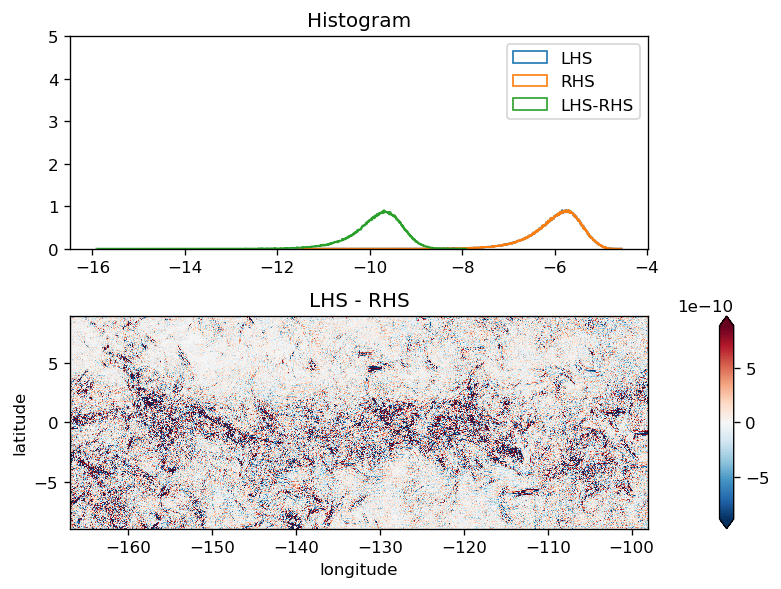

In [37]:
level = 120
levelp = level + 1

terms = budget.isel(depth=level).squeeze()

metrics_sub = metrics.isel(depth=level, latitude=slice(1, -1), longitude=slice(1, -1))
cellvol = metrics_sub.cellvol.transpose()

terms['ADVr_THp'] = budget['ADVr_TH'].isel(depth=levelp).squeeze()
terms['DFrI_THp'] = budget['DFrI_TH'].isel(depth=levelp).squeeze()
terms['KPPg_THp'] = budget['KPPg_TH'].isel(depth=levelp).squeeze()

surf_mass = terms.WTHMASS[1:-1, 1:-1] * metrics_sub.RAC[1:-1, 1:-1]

# constants taken from diagnostics.log (I think)
global_area = 2.196468634481708E+13
rhoConst = 1035
Cp = 3994
TsurfCor = surf_mass.sum() / global_area

LHS = terms.TOTTTEND[1:-1, 1:-1] / 86400

ADVx = (terms.ADVx_TH.values[2:, 1:-1] -
        terms.ADVx_TH.values[1:-1, 1:-1]) / cellvol
ADVy = (terms.ADVy_TH.values[1:-1, 2:] -
        terms.ADVy_TH.values[1:-1, 1:-1]) / cellvol
ADVr = (terms.ADVr_TH.fillna(0).values[1:-1, 1:-1] -
        terms.ADVr_THp.values[1:-1, 1:-1]) / cellvol

# no explicit diffusion
# DFxE = (terms.DFxE_TH.values[2:, 1:-1] - terms.DFxE_TH.values[1:-1, 1:-1]) / cellvol
# DFyE = (terms.DFyE_TH.values[1:-1, 2:] - terms.DFyE_TH.values[1:-1, 1:-1]) / cellvol
# DFrE = (terms.DFrE_TH.values[1:-1, 1:-1] - terms.DFrE_THp.values[1:-1, 1:-1]) / cellvol
DFrI = (terms.DFrI_TH.fillna(0).values[1:-1, 1:-1] -
        terms.DFrI_THp.values[1:-1, 1:-1]) / cellvol

# non-local stuff only in mixing layer
KPPg = (terms.KPPg_TH.fillna(0).values[1:-1, 1:-1] -
        terms.KPPg_THp.fillna(0).values[1:-1, 1:-1]) / cellvol

ADV = LHS.copy(data=ADVx + ADVy + ADVr)
DIFF = LHS.copy(data=DFrI + KPPg)  # no explicit horizontal diffusion
ADV.name = 'ADV'
DIFF.name = 'DIFF'

SW = (terms.oceQsw[1:-1, 1:-1] / (rhoConst * Cp) /
      (metrics_sub.dRF * metrics_sub.hFacC) * terms.swprofile)

RHS = (ADV + DIFF + SW)

# surface level stuff
if level == 0:
    # surface tendency due to SW flux
    tflx_tend = ((terms.TFLUX[1:-1, 1:-1] - terms.oceQsw[1:-1, 1:-1]) /
                 (rhoConst * Cp * metrics_sub.dRF * metrics_sub.hFacC))

    # tendency due to mass correction
    surf_corr_tend = -(
        (terms.WTHMASS[1:-1, 1:-1] - TsurfCor) / (metrics_sub.dRF * metrics_sub.hFacC))

    RHS += tflx_tend + surf_corr_tend

RHS *= -1
    
plot_lhs_rhs(LHS, RHS)

## Momentum budget

Momentum budget emails:

- http://mailman.mitgcm.org/pipermail/mitgcm-support/2010-December/006921.html
- http://mailman.mitgcm.org/pipermail/mitgcm-support/2013-December/008702.html
- http://mailman.mitgcm.org/pipermail/mitgcm-support/2017-July/011196.html
- http://mailman.mitgcm.org/pipermail/mitgcm-devel/2019-June/007077.html

### read in data

Need to append zeros to the viscosity terms because the bottom level is not stored :/

In [ ]:
ssh_files = xr.open_mfdataset(dirname + 'File_*_etan.nc', chunks={"latitude": 120, "longitude": 500}, combine="by_coords", parallel=True)
ub_files = xr.open_mfdataset(dirname + 'File_*_ub.nc', chunks={"latitude": 120, "longitude": 500}, combine="by_coords", parallel=True)
vb_files = xr.open_mfdataset(dirname + 'File_*_vb.nc', chunks={"latitude": 120, "longitude": 500}, combine="by_coords", parallel=True)
# sf_files = xr.open_mfdataset(dirname + 'File_*_surf.nc', chunks={"latitude": 120, "longitude": 500}, combine="by_coords", parallel=True)[["ETAN"]]
budget = (xr.merge([ub_files, vb_files, ssh_files])
          .transpose('longitude', 'latitude', 'depth', 'time')).squeeze()

# From http://mailman.mitgcm.org/pipermail/mitgcm-support/2010-December/006920.html
# And to get a tendency from this vertical flux:
# Um_Impl(:,:,k) =[ VISrI_Um(:,:,k+1) - VISrI_Um(:,:,k) ]
#                /[ rAw(:,:)*drF(k)*hFacW(:,:,k) ]
# (hope I got the sign right)
# VISrI_Um(k=1) should be zero, and the bottom one (k=Nr+1)
# is not shored in the output file but it's also zero.

budget["VISrI_Um"] = budget.VISrI_Um.fillna(0)  # fills surface values with 0 
budget["VISrI_Vm"] = budget.VISrI_Vm.fillna(0)

In [44]:
# NOTE: This is totally wrong now since TPOS_MITgcm_20 is only a top 1000m subset.
VISrI_Um = xr.concat(
    [
        budget.VISrI_Um,
        xr.zeros_like(budget.VISrI_Um.isel(depth=0).drop("depth")).expand_dims(depth=[-5865.922])        
    ],
    dim="depth",
)

VISrI_Vm = xr.concat(
    [
        budget.VISrI_Vm,
        xr.zeros_like(budget.VISrI_Vm.isel(depth=0).drop("depth")).expand_dims(depth=[-5865.922])        
    ],
    dim="depth",
)

In [42]:
metrics = (
    read_metrics(dirname, 
                 longitude=budget.longitude, 
                 latitude=budget.latitude,
                 depth=budget.depth)
    .chunk({"latitude": 120, "longitude": 500})
)
metrics

<xarray.Dataset>
Dimensions:    (depth: 136, depth_left: 137, latitude: 400, longitude: 1420)
Coordinates:
  * depth      (depth) float64 -1.25 -3.75 -6.25 -8.75 ... -824.4 -881.7 -944.4
  * latitude   (latitude) float64 -10.0 -9.95 -9.9 -9.85 ... 9.85 9.9 9.95 10.0
  * longitude  (longitude) float64 -168.0 -167.9 -167.9 ... -97.1 -97.05 -97.0
Dimensions without coordinates: depth_left
Data variables:
    dRF        (depth) float32 dask.array<chunksize=(136,), meta=np.ndarray>
    hFacC      (depth, latitude, longitude) float32 dask.array<chunksize=(136, 120, 500), meta=np.ndarray>
    RAC        (latitude, longitude) float32 dask.array<chunksize=(120, 500), meta=np.ndarray>
    DXC        (latitude, longitude) float32 dask.array<chunksize=(120, 500), meta=np.ndarray>
    DYC        (latitude, longitude) float32 dask.array<chunksize=(120, 500), meta=np.ndarray>
    cellvol    (latitude, longitude, depth) float32 dask.array<chunksize=(120, 500, 136), meta=np.ndarray>
    RF         (depth_left) float32 dask.array<chunksize=(137,), meta=np.ndarray>
    rAw        (latitude, longitude) float32 dask.array<chunksize=(120, 500), meta=np.ndarray>
    hFacW      (depth, latitude, longitude) float32 dask.array<chunksize=(136, 120, 500), meta=np.ndarray>
    drF        (depth) float32 dask.array<chunksize=(136,), meta=np.ndarray>

###  U momentum

We are using `implicSurfPres=1` and Scott is saving SSH at the appropriate timestep.

In [45]:
level = 120; # depth level # budget.sizes["depth"]

#SSHx = - 9.81 * budget.ETAN.copy(
#    data=np.gradient(budget.ETAN, axis=budget.ETAN.get_axis_num("longitude"))
#) / metrics.DXC


# when trying to do a budget over just 1 time-step, one needs to be aware 
#  of the precise time-discretisation of the the first term which is evaluated 
#  in the model as 
#   - gravity * {  implicSurfPress * (d.EtaN/dx)^n+1 
#                +(1-implicSurfPress)*(d.EtaN/dx)^n }
#  (using the default implicSurfPress=1 , it might be be easier to use 
#   snap-shot output Eta.[iter+1] to get EtaN^n+1 )

# this works because Scott has saved SSH one timestep prior to the saved timestep for the other fields
SSHx = (-9.81 * budget.ETAN.diff("longitude")
        .reindex(longitude=budget.longitude) 
        / metrics.DXC)

# from http://mailman.mitgcm.org/pipermail/mitgcm-support/2010-December/006921.html
Um_Impl =( VISrI_Um.diff("depth", label="lower")
          / (metrics.rAw * metrics.drF.isel(depth=level) * metrics.hFacW.isel(depth=level)))


RHS = (
    SSHx
    + budget.Um_dPHdx
    + budget.Um_Advec
    #+ budget.Um_Cori  # is in Um_Advec
    + budget.Um_Diss
    + Um_Impl
    + budget.Um_Ext.fillna(0)
    + budget.AB_gU
).isel(depth=level)

LHS = budget.TOTUTEND.isel(depth=level) / 86400

#da = xr.Dataset({"LHS": LHS, "RHS": RHS}).to_array("variable")
#da.compute().plot(row="variable", robust=True, x="longitude", cbar_kwargs={"orientation": "horizontal"})

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/dask/array/core.py:3908: PerformanceWarning: Increasing number of chunks by factor of 20
  **blockwise_kwargs,


Task was destroyed but it is pending!
task: <Task pending coro=<Nanny._on_exit() running at /glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/distributed/nanny.py:406> wait_for=<Future pending cb=[<TaskWakeupMethWrapper object at 0x2b8d2c255918>()]> cb=[IOLoop.add_future.<locals>.<lambda>() at /glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/tornado/ioloop.py:690]>


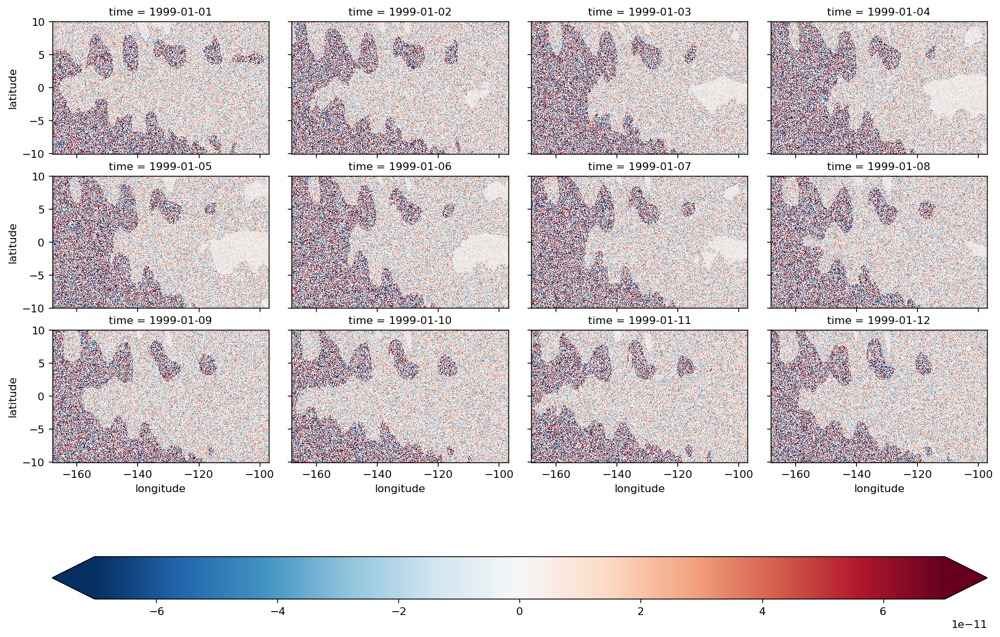

In [49]:
(LHS-RHS).isel(time=slice(12)).compute().plot(col="time", col_wrap=4, cbar_kwargs={"orientation": "horizontal"}, x="longitude", robust=True)

In [ ]:
diff = (LHS-RHS).compute()

In [ ]:
diff.mean("time").plot(robust=True, x="longitude")

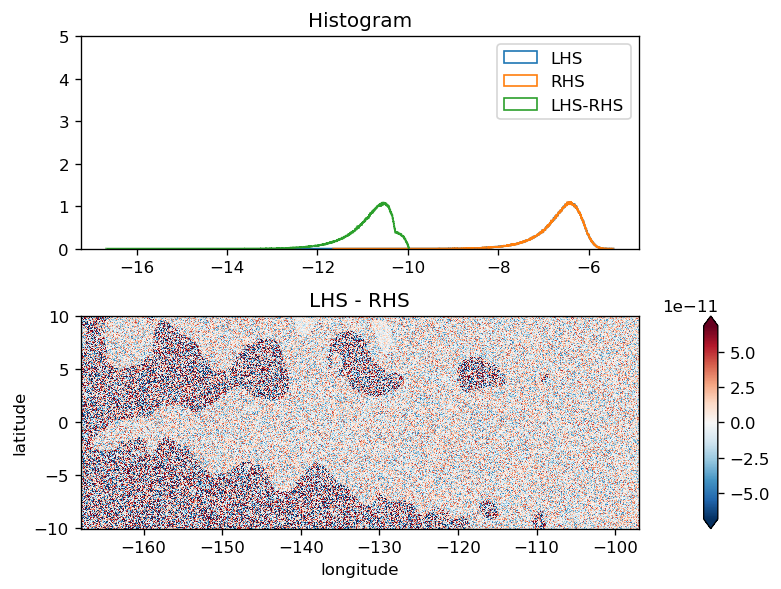

In [50]:
plot_lhs_rhs(LHS.isel(time=10), RHS.isel(time=10))

#### all time steps

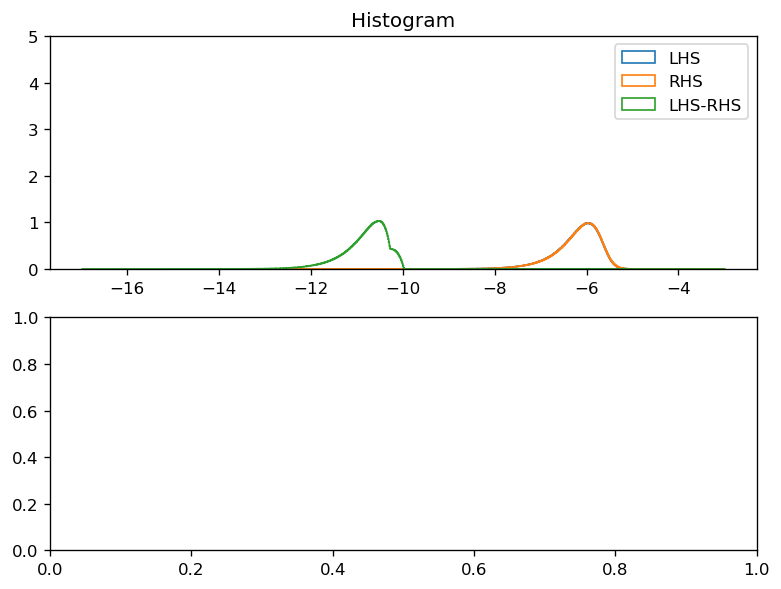

In [48]:
plot_lhs_rhs(LHS, RHS)

#### after shifting SSH one iteration back in time

residual ~ 1e-11

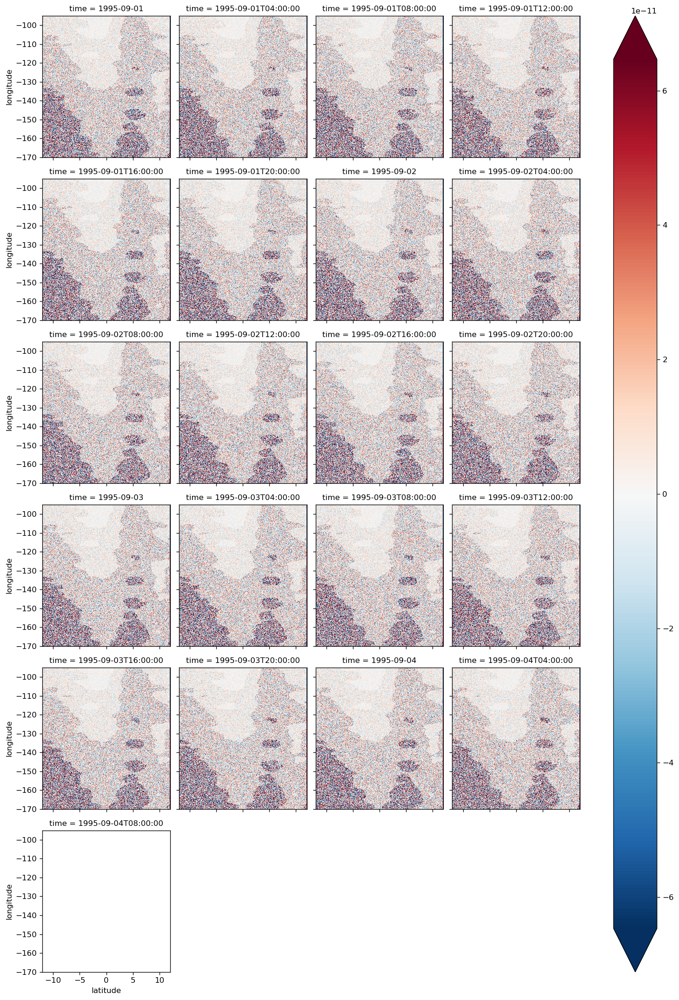

In [42]:
diff.plot(col="time", col_wrap=4, robust=True)

#### before shifting SSH one iteration back in time

residual ~ 1e-7

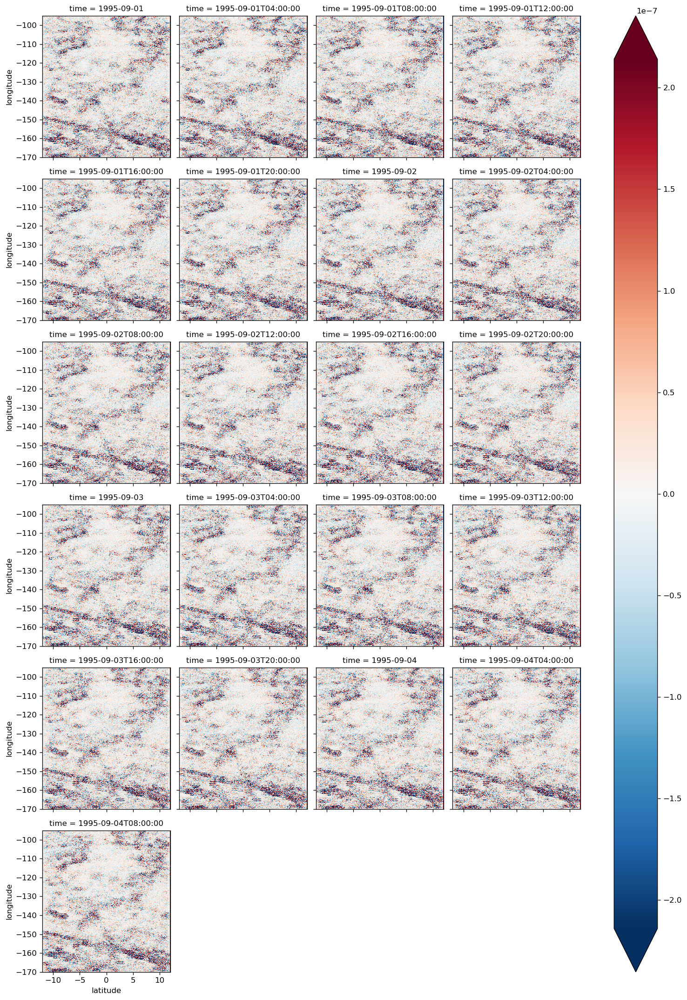

In [22]:
diff.plot(col="time", col_wrap=4, robust=True)

### V momentum

This seems to have some systematic error but it is small

In [51]:
level = 10

SSHy = (-9.81 * budget.ETAN
        .diff("latitude", label="upper")
        .reindex(latitude=budget.latitude)
        / metrics.DYC)

# from http://mailman.mitgcm.org/pipermail/mitgcm-support/2010-December/006921.html
Vm_Impl =( VISrI_Vm.diff("depth", label="lower")
          / (metrics.rAw * metrics.drF.isel(depth=level) * metrics.hFacW.isel(depth=level)))
RHS = (
    SSHy
    + budget.Vm_dPHdy
    + budget.Vm_Advec
    #+ budget.Vm_Cori  # in Vm_Advec
    + budget.Vm_Diss
    + Vm_Impl
    + budget.Vm_Ext.fillna(0)
    + budget.AB_gV
).isel(depth=level) 

LHS = budget.TOTVTEND.isel(depth=level) / 86400

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/dask/array/core.py:3908: PerformanceWarning: Increasing number of chunks by factor of 21
  **blockwise_kwargs,


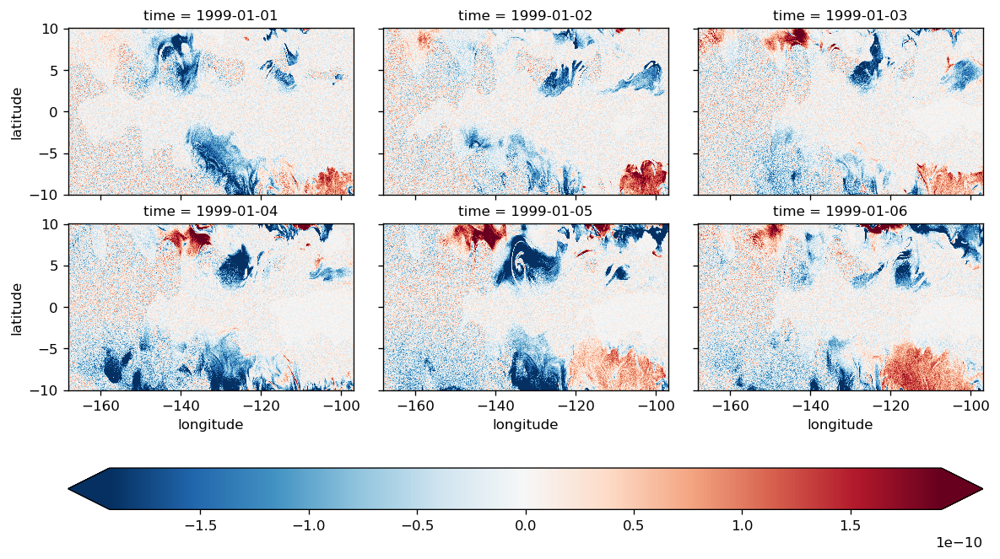

In [55]:
(LHS-RHS).isel(time=slice(6)).compute().plot(
    col="time", 
    col_wrap=3,
    x="longitude", 
    cbar_kwargs={"orientation": "horizontal"}, 
    robust=True
)

#### all time steps

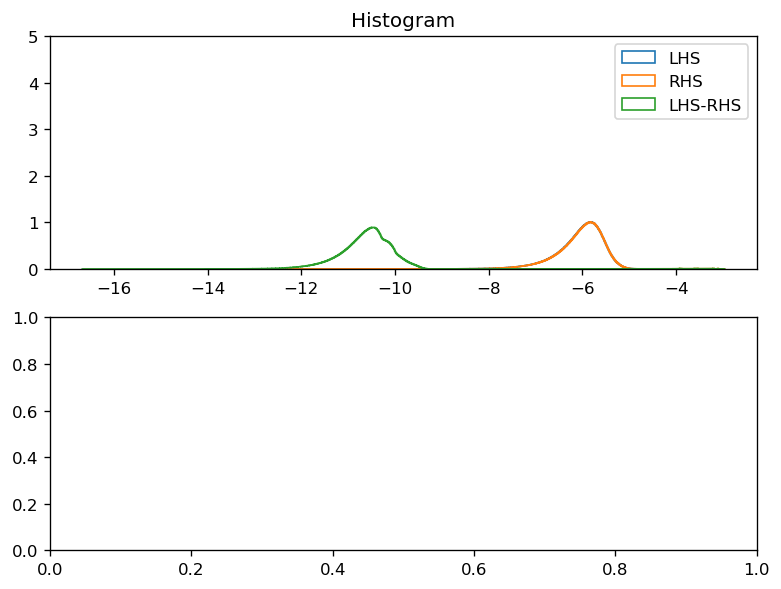

In [43]:
plot_lhs_rhs(LHS, RHS)

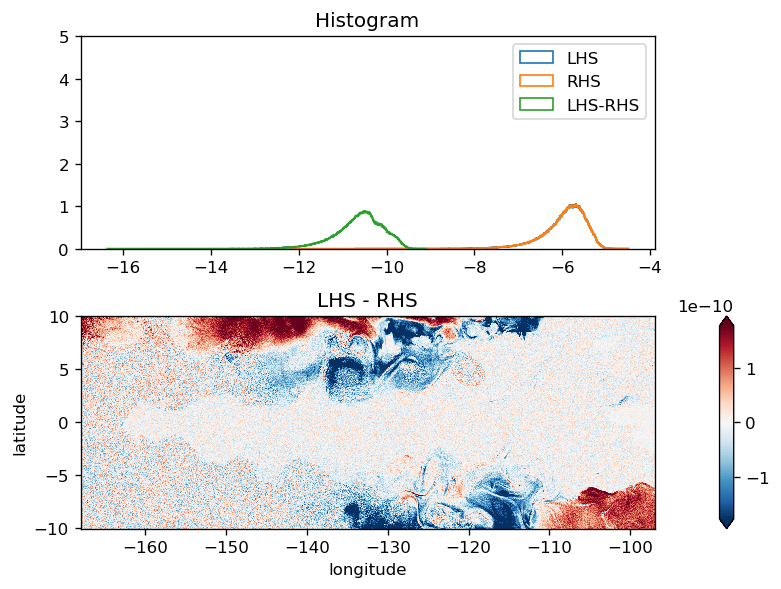

In [56]:
plot_lhs_rhs(LHS.isel(time=20), RHS.isel(time=20))